# Example 1: A simple example from the FastHenry documentation.
This example is a recreation of the example in section 1.2 of "[FastHenry User's Guide](https://github.com/ediloren/FastHenry2/blob/master/doc/FastHenry_User_Guide.pdf)" using FastHeneryHelper.

In [1]:
using FastHenryHelper

┌ Info: Precompiling FastHenryHelper [075fbb30-7a8a-11e8-208e-7feee39ec577]
└ @ Base loading.jl:1186


Create a group of FastHenry elements for FastHenry to compute the loop inductance of an L shaped trace over a ground plane with the trace's return path through the plane.

In [2]:
sp = SegmentParameters(w=8,h=1)
n1 = Node("1",0,200,1.5)
n2 = Node(800,200,1.5)
n3 = Node(800,800,1.5)
nin = Node("in",800,800,0)
nout = Node("out",0,200,0)
example1 = Group(
    elements = [Comment("A FastHenry example using a reference plane"),
                Units("mils"),
                UniformPlane(
                    x1=0,    y1=0,    z1=0,
                    x2=1000, y2=0,    z2=0,
                    x3=1000, y3=1000, z3=0,
                    thick= 1.2,
                    seg1=20, seg2=20,
                    nodes=[nin, nout]),
                Default(SegmentParameters(sigma=62.1e6*2.54e-5,nwinc=8, nhinc=1)),
                n1, n2, n3,
                Segment(n1,n2,sp),
                Segment(n2,n3,sp),
                Equiv([nin,n3]),
                External(n1,nout),
                Freq(min=1e-1, max=1e9, ndec=0.05),
                End()
        ]
    )

* A FastHenry example using a reference plane
.units mils
G_1
+ x1=0.000000000e+00 y1=0.000000000e+00 z1=0.000000000e+00
+ x2=1.000000000e+03 y2=0.000000000e+00 z2=0.000000000e+00
+ x3=1.000000000e+03 y3=1.000000000e+03 z3=0.000000000e+00
+ thick=1.200000000e+00 seg1=20 seg2=20
+ Nin (8.000000000e+02,8.000000000e+02,0.000000000e+00)
+ Nout (0.000000000e+00,2.000000000e+02,0.000000000e+00)
.default
+  nhinc=1 nwinc=8
+  sigma=1.577340000e+03
N1 x=0.000000000e+00 y=2.000000000e+02 z=1.500000000e+00
N_2 x=8.000000000e+02 y=2.000000000e+02 z=1.500000000e+00
N_3 x=8.000000000e+02 y=8.000000000e+02 z=1.500000000e+00
E_4 N1 N_2
+  w=8.000000000e+00 h=1.000000000e+00
E_5 N_2 N_3
+  w=8.000000000e+00 h=1.000000000e+00
.equiv Nin N_3
.external N1 Nout 
.freq fmin=1.000000000e-01 fmax=1.000000000e+09 ndec=5.000000000e-02
.end


Write example1 to a file.

In [3]:
open("example1.inp","w") do io
    show(io,example1)
end

Groups may be transformed.  To demonstrate, example1 is rotated 90deg around x,y,and z axis.

In [4]:
transform!(example1,rx(0.5π)*ry(0.5π)*rz(0.5π))  # must keep plane parallel to xy, xz, or yz plane

Write rotated example1 to a file

In [5]:
open("example1_rotated.inp","w") do io
    show(io,example1)
end

calling `push!` on a `Group` will push into the groups `elements`.

In [6]:
# same example, using push!
example1 = Group()
push!(example1,Comment("A FastHenry example using a reference plane"))
push!(example1,Units("mils"))
nin = Node("in",800,800,0)
nout = Node("out",0,200,0)
push!(example1,UniformPlane(x1=0, y1=0, z1=0, x2=1000, y2=0, z2=0, x3=1000, y3=1000, z3=0,
    thick= 1.2, seg1=20, seg2=20, nodes=[nin, nout]))
push!(example1,Default(SegmentParameters(sigma=62.1e6*2.54e-5,nwinc=8, nhinc=1)))
n1 = Node("1",0,200,1.5)
push!(example1,n1)
n2 = Node(800,200,1.5)
push!(example1,n2)
n3 = Node(800,800,1.5)
push!(example1,n3)
sp = SegmentParameters(w=8,h=1)
push!(example1,Segment(n1,n2,sp))
push!(example1,Segment(n2,n3,sp))
push!(example1,Equiv([nin,n3]))
push!(example1,External(n1,nout))
push!(example1,Freq(min=1e-1, max=1e9, ndec=0.05))
push!(example1,End());

Plot of `example1`

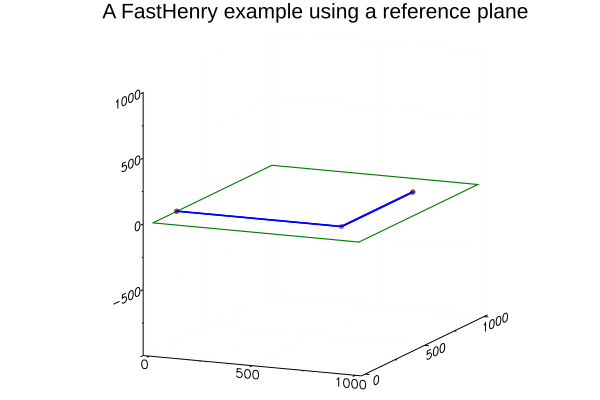

In [7]:
using Plots
gr() # plotlyjs or plotly for interactive plot
plt=plot(example1)